# Calculating Betweenness Centrality using Python

In [47]:
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

ox.config(use_cache=True, log_console=True)

C:\Users\GrHalbgott\AppData\Local\Temp\ipykernel_11140\2470159562.py:8: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  ox.config(use_cache=True, log_console=True)


Download OSM data for a specific place

In [51]:
aoi = "Heilbronn"
graph = ox.graph_from_place(aoi, network_type="drive")

Plot the graph

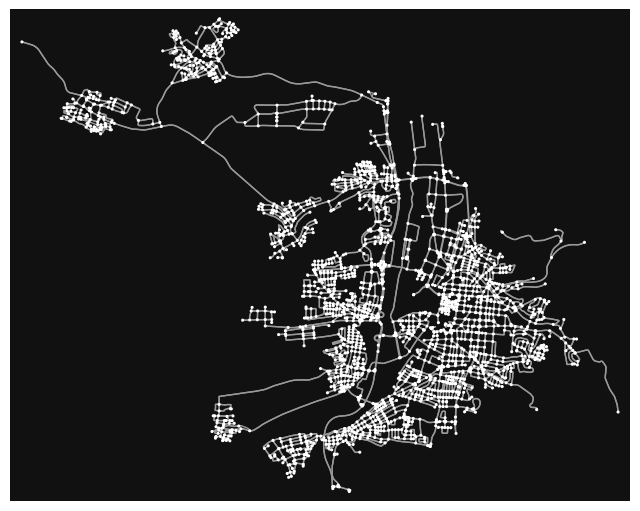

In [52]:
fig, ax = ox.plot_graph(graph, node_size=5)

### Centrality

Calculate betweenness centrality using the shortest routes (i.e. `weight='length'` means that we use the length of each edge).

In [53]:
betweenness_centrality = nx.edge_betweenness_centrality(graph, weight="length")

Convert the values in `betweenness_centrality` into a `pandas.Dataframe`.

In [54]:
centrality_df = pd.DataFrame(index=betweenness_centrality.keys(), data=betweenness_centrality.values())

Name the two index columns of the `centrality_df` 'u' and 'v'.

In [55]:
centrality_df.reset_index(inplace=True)
centrality_df.columns = ['u', 'v', 'key', 'centrality']
centrality_df = centrality_df.set_index(['u', 'v', 'key'])

Converting the graph to a `geopandas.GeoDataFrame` yields two dataframes. One for the nodes, and one for the edges.

In [56]:
edges_df = ox.graph_to_gdfs(graph)[1] 

Join the `centrality_df` with the `edges_df`.

In [57]:
centrality_gdf = centrality_df.join(edges_df[['osmid', 'geometry']])
centrality_gdf = gpd.GeoDataFrame(centrality_gdf, crs=4326)

Now that the centrality values have been joined with the edges which include the geometries, we can plot the centrality values of the road network on a map using the `geopandas.explore()` function.

In [58]:
centrality_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

In [59]:
centrality_gdf["osmid"] = centrality_gdf["osmid"].apply(lambda x: str(x))

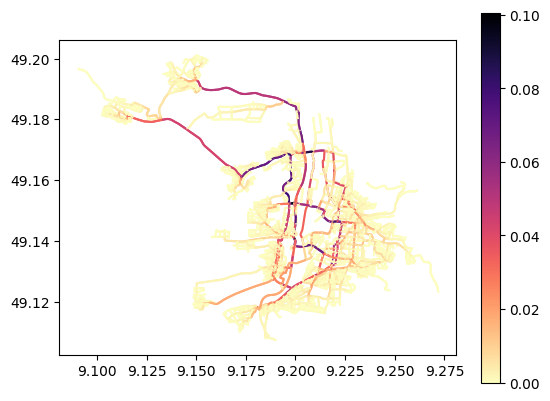

In [60]:
centrality_gdf.plot(column="centrality", cmap="magma_r", legend=True)
ax.set(title=
        f"Betweenness Centrality for {aoi}\n using shortest routes"
    )
plt.show()

### Betweenness centrality using the fastest routes
Calculate centrality using the fastest route instead of the shortest route.


1. Assign travel speed values to each edge using the `ox.add_edge_speeds` function. **Fill in the missing road types in the dictionary below** based on the [openrouteservice documetation on travel speeds](https://giscience.github.io/openrouteservice/documentation/travel-speeds/Waytype-Speeds.html).

In [61]:
import requests
import json

r = requests.get(r"https://raw.githubusercontent.com/GIScience/openrouteservice/master/ors-engine/src/main/resources/resources/services/routing/speed_limits/car.json")
if r.status_code == 200:
    hwy_speeds = r.json()["default"]

In [62]:
graph_with_speeds = ox.add_edge_speeds(graph, hwy_speeds)

2. Calculate the travel time for each edge using the `ox.add_edge_travel_times` function.

In [63]:
graph_with_travel_times = ox.speed.add_edge_travel_times(graph_with_speeds)

3. Calculate betweenness centrality again using the `nx.edge_betweenness_centrality` but pass `weight="travel_time` as an argument.


In [64]:
betweenness_centrality_time = nx.edge_betweenness_centrality(graph_with_travel_times, weight="travel_time")

4. Convert the centrality value to a `pandas.DataFrame` and join it with the `edges_df` dataframe as above and visualize the result in a map.

In [65]:
centrality_df = pd.DataFrame(index=betweenness_centrality_time.keys(), data=betweenness_centrality_time.values())

centrality_df.reset_index(inplace=True)
centrality_df.columns = ['u', 'v', 'key', 'centrality']
centrality_df = centrality_df.set_index(['u', 'v', 'key'])

edges_df = ox.graph_to_gdfs(graph)[1] 

centrality_gdf = centrality_df.join(edges_df[['osmid', 'geometry']])
centrality_gdf = gpd.GeoDataFrame(centrality_gdf, crs=4326)

In [66]:
centrality_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

In [67]:
centrality_gdf["osmid"] = centrality_gdf["osmid"].apply(lambda x: str(x))

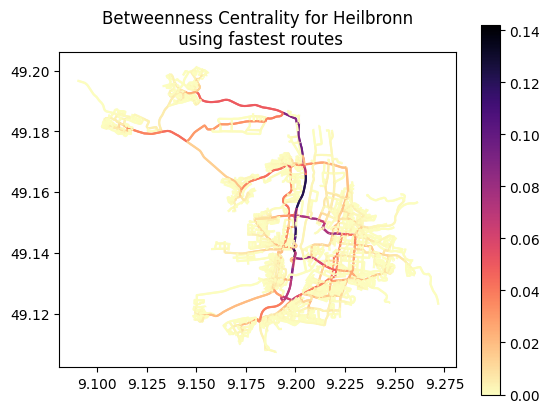

In [68]:
ax = centrality_gdf.plot(column="centrality", cmap="magma_r", legend=True)
ax.set(title=
        f"Betweenness Centrality for {aoi}\n using fastest routes"
    )
plt.show()

### Geographically adapted betweenness centrality

1. Get start and destination nodes in the graph from geographic coordinates using the `nearest_nodes` function.

In [69]:
def select_random_coords(bounds, n_routes: int):
    """
    Returns random x and y coordinates within bounds
    :param: bounds: tuple of total bounds of edges/graph
    :param: n_routes: number of routes to be calculated
    :return: coordinate lists for x and y
    """
    minx, miny, maxx, maxy = bounds
    x_coords = np.random.uniform(minx, maxx, n_routes)
    y_coords = np.random.uniform(miny, maxy, n_routes)

    return x_coords, y_coords

In [70]:
aoi_gdf = ox.geocode_to_gdf(aoi).to_crs(epsg=4326)
aoi_bounds = aoi_gdf.total_bounds

In [71]:
n_routes = 2

start_x, start_y = select_random_coords(aoi_bounds, n_routes)
dest_x, dest_y = select_random_coords(aoi_bounds, n_routes)

In [72]:
start_node = ox.nearest_nodes(graph, start_x[0], start_y[1])

In [73]:
dest_node = ox.nearest_nodes(graph, dest_x[0], dest_y[1])

2. Calculate route between the two nodes using the `ox.shortest_path()` function.

In [74]:
route = ox.shortest_path(graph, start_node, dest_node, weight="travel_time")

3. Plot the route using

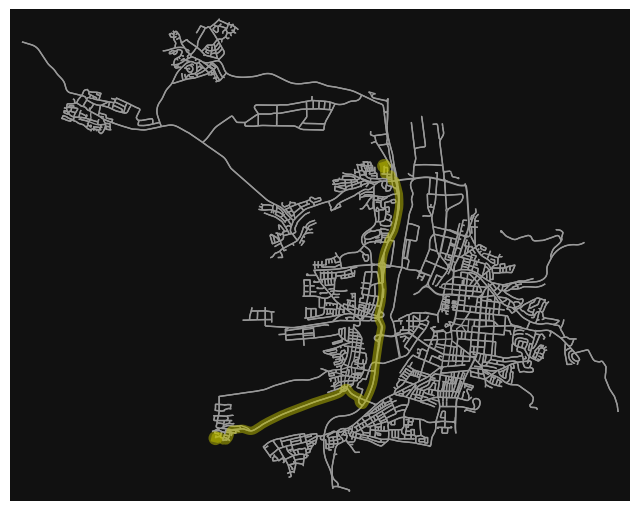

In [75]:
fig, ax = ox.plot_graph_route(graph, route, route_color="y", route_linewidth=6, node_size=0)

4. Convert the route to a `geopandas.GeoDataFrame` using the `ox.utils_graph.route_to_gdf`.

In [76]:
route_gdf = ox.utils_graph.route_to_gdf(graph, route)

5. Generate 100 routes by choosing random start and endpoints.

In [84]:
n_routes = 250

start_x, start_y = select_random_coords(aoi_bounds, n_routes)
dest_x, dest_y = select_random_coords(aoi_bounds, n_routes)
start_nodes = ox.nearest_nodes(graph, start_x, start_y)
dest_nodes = ox.nearest_nodes(graph, dest_x, dest_y)

routes_gdf = []
no_route = 0
no_edges = 0
routes = ox.shortest_path(graph, start_nodes, dest_nodes, weight="travel_time")
for route in routes:
    if route is None:
        no_route += 1
        continue
    elif len(route) <= 1:
        no_edges += 1
        continue
    else:
        routes_gdf.append(ox.utils_graph.route_to_gdf(graph, route))
    

In [85]:
print(f"Number of routes: {n_routes}")
print(f"Number of missing routes: {no_route}")
print(f"Number of routes without edges: {no_edges}")

Number of routes: 250
Number of missing routes: 6
Number of routes without edges: 9


6. Merge all route dataframes using the `pd.concat` function

In [86]:
gdf = pd.concat(routes_gdf, axis=0)

7. Calculate betweenness centrality indicator of the graph by grouping the routes by the columns 'u', 'v' and 'key' and counting the number of features.

In [87]:
key_list = ["u", "v", "key"]
centrality = gdf.groupby(key_list).size().reset_index().rename(columns={0: "centrality"}).set_index(key_list) 

8. Join the dataframe containing the manually computed centrality values with the `edges_df` dataframe. Plot the manually computed betweenness centrality on an interactive map.

In [88]:
geog_centrality_gdf = edges_df.join(centrality)

In [89]:
geog_centrality_gdf.explore(column="centrality", cmap="magma_r", tiles="cartodbpositron")

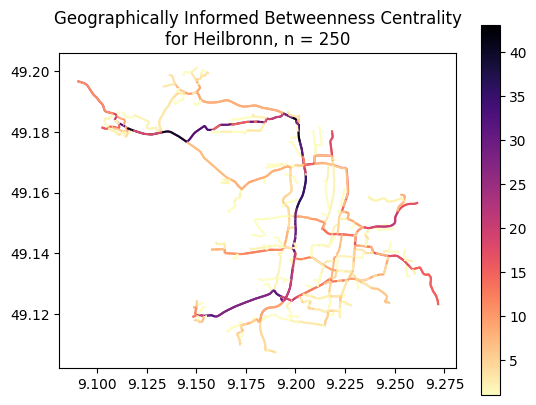

In [90]:
ax = geog_centrality_gdf.plot(column="centrality", cmap="magma_r", legend=True)
ax.set(title=f"Geographically Informed Betweenness Centrality\nfor {aoi}, n = {n_routes}")
plt.show()

 ### Bonus

Write a function which chooses a start and destination node from the graph based on the population distribution from the [Global Human Settlement population layer](https://ghsl.jrc.ec.europa.eu/download.php?ds=pop).

